<a href="https://colab.research.google.com/github/fawazdhianabil/Orbit-Future-Academy-MSIB/blob/main/Decision_Tree.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation


**Memanggil Dataset**

Sebelum memanggil dataset, dataset bisa di download pada link [ini](https://drive.google.com/file/d/1zHjUJb_32DG_-xeCWoa8XQEIl4FWaw6Z/view?usp=sharing
).

Setelah dataset berhasil di download, upload file dataset pada Google Colab agar dapat digunakan. 


In [2]:
# load dataset
db = pd.read_csv("https://raw.githubusercontent.com/fawazdhianabil/Orbit-Future-Academy-MSIB/main/diabetes.csv")

db

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [3]:
db.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [4]:
#split dataset in features and target variable

x = db.iloc[:, :8] # Features
y = db.iloc[:, 8] # Target variable

In [5]:
print(x, y)

     Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
0              6      148             72             35        0  33.6   
1              1       85             66             29        0  26.6   
2              8      183             64              0        0  23.3   
3              1       89             66             23       94  28.1   
4              0      137             40             35      168  43.1   
..           ...      ...            ...            ...      ...   ...   
763           10      101             76             48      180  32.9   
764            2      122             70             27        0  36.8   
765            5      121             72             23      112  26.2   
766            1      126             60              0        0  30.1   
767            1       93             70             31        0  30.4   

     DiabetesPedigreeFunction  Age  
0                       0.627   50  
1                       0.351   31  


In [6]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42) # 80% training and 20% test

In [7]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [8]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.7272727272727273


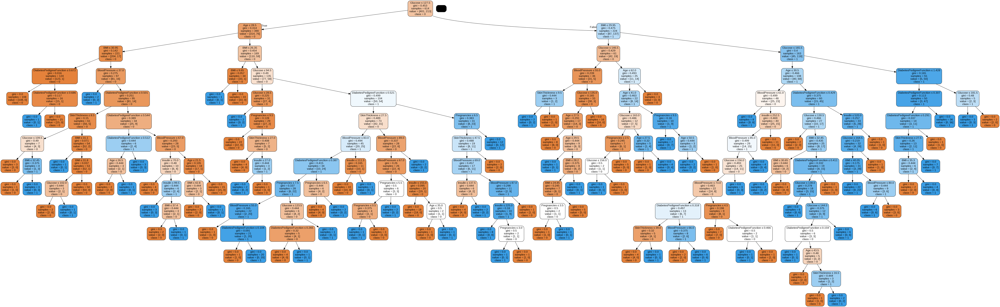

In [9]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image  
import pydotplus

feature_cols = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age']
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols, class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('diabetes.png')
Image(graph.create_png())

Perhitungan skor feature apa yang paling penting

Feature: Pregnancies Score:  0.058320197882203675 %
Feature: Glucose Score:  0.32008032425027705 %
Feature: BloodPressure Score:  0.13785866051249487 %
Feature: SkinThickness Score:  0.05005861830977831 %
Feature: Insulin Score:  0.06015758810889729 %
Feature: BMI Score:  0.16447022646830095 %
Feature: DiabetesPedigreeFunction Score:  0.09540652654262335 %
Feature: Age Score:  0.1136478579254245 %


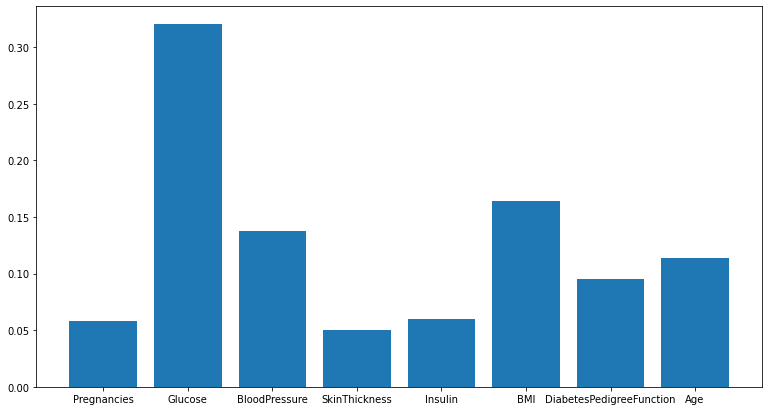

In [10]:
import matplotlib.pyplot as plt

importance = clf.feature_importances_
for i,v in enumerate(importance):
	print('Feature:', feature_cols[i],'Score: ', v, '%')
# plot feature importance
plt.figure(figsize=(13,7))
plt.bar([x for x in feature_cols], importance)
plt.show()



---



## **Tugas**

Lakukan Klasifikasi Customer Churn dengan Decision Tree:
1. buat model dan gambar pohonnya
2. Cari feature apa yang paling penting di kasus tersebut.
3. Hitung akurasinya, bandingkan dengan hasil di KNN, mana kah model yang lebih baik untuk kasus Customer churn?

In [11]:
df = pd.read_csv('https://raw.githubusercontent.com/fawazdhianabil/Orbit-Future-Academy-MSIB/main/churnprediction_ch9.csv')
df.head()

,customer_id,product,reload_1,reload_2,video,music,games,chat_1,chat_2,socmed_1,socmed_2,internet,days_active,tenure,churn
0,285fae8412c4720a0c79d95f98434422,Kartu A,27734.30,24381.32,22000.0,33009.9,25669.97,1716.0,2145.0,0.0,792.0,11000.0,15,776,0
1,f45bce87ca6bf100f222fcc0db06b624,Kartu A,26433.00,26515.50,0.0,0.0,0.00,0.0,15444.0,0.0,0.0,74151.0,13,352,0
2,09b54557b1e2a10d998e3473a9ccd2a0,Kartu A,93212.17,67101.83,0.0,0.0,0.00,86795.5,94649.5,330.0,1485.0,27467.0,15,1987,0
3,11f252f48be36f93dd429f2ec86cb2f5,Kartu A,183.33,1087.17,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,2,285,0
4,a8df29ae9195eea348d2f74c967b978d,Kartu A,95296.67,76246.50,0.0,0.0,11000.00,118800.0,104940.0,0.0,0.0,63855.0,15,1081,0


In [12]:
# Pada product, nilai atribut Kartu A didefinisikan sebagai 0, Kartu B didefinisikan sebagai 1, dan Kartu C didefinisikan sebagai 2
df['product'] = df['product'].map({'Kartu A': 0,'Kartu B': 1, 'Kartu C':2})
df['product'].value_counts()
df

,customer_id,product,reload_1,reload_2,video,music,games,chat_1,chat_2,socmed_1,socmed_2,internet,days_active,tenure,churn
0,285fae8412c4720a0c79d95f98434422,0,27734.30,24381.32,22000.0,33009.9,25669.97,1716.0,2145.0,0.0,792.0,11000.0,15,776,0
1,f45bce87ca6bf100f222fcc0db06b624,0,26433.00,26515.50,0.0,0.0,0.00,0.0,15444.0,0.0,0.0,74151.0,13,352,0
2,09b54557b1e2a10d998e3473a9ccd2a0,0,93212.17,67101.83,0.0,0.0,0.00,86795.5,94649.5,330.0,1485.0,27467.0,15,1987,0
3,11f252f48be36f93dd429f2ec86cb2f5,0,183.33,1087.17,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,2,285,0
4,a8df29ae9195eea348d2f74c967b978d,0,95296.67,76246.50,0.0,0.0,11000.00,118800.0,104940.0,0.0,0.0,63855.0,15,1081,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9e8b318d96caa9c0c4a50e8e59f5026c,1,1634.33,12085.33,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,1,490,1
9996,a310627191bdbded3905ac73e77fe319,1,30000.33,45170.67,0.0,0.0,0.00,0.0,20001.0,0.0,0.0,0.0,1,3120,1
9997,b6f11059e5c1df69b8c16d5c39af23dc,1,3333.33,13338.67,0.0,0.0,872.00,0.0,0.0,0.0,0.0,0.0,1,483,1
9998,88709f1defd232243f729912be696f87,1,25000.00,33333.33,0.0,0.0,23497.33,0.0,0.0,0.0,0.0,0.0,15,786,1


In [13]:
# atribut predictor
x = df[['product', 'reload_1', 'reload_2', 'video', 'music', 'games', 'chat_1',
       'chat_2', 'socmed_1', 'socmed_2', 'internet', 'days_active', 'tenure']]
# atribut target
y = df['churn'].values

In [14]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42) # 80% training and 20% test

In [15]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.936


In [18]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image  
import pydotplus

feature_cols = ['product', 'reload_1', 'reload_2', 'video', 'music', 'games', 'chat_1',
       'chat_2', 'socmed_1', 'socmed_2', 'internet', 'days_active', 'tenure']
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols, class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('churn.png')
Image(graph.create_png())

Feature: product Score:  0.021243142746771127 %
Feature: reload_1 Score:  0.03744346130214225 %
Feature: reload_2 Score:  0.3507442032644252 %
Feature: video Score:  0.008520096731888565 %
Feature: music Score:  0.006164831162959233 %
Feature: games Score:  0.031041789713238295 %
Feature: chat_1 Score:  0.018744188238406647 %
Feature: chat_2 Score:  0.005470539219673822 %
Feature: socmed_1 Score:  0.004687213406185605 %
Feature: socmed_2 Score:  0.004606610318667584 %
Feature: internet Score:  0.04962843758414864 %
Feature: days_active Score:  0.2289314158423168 %
Feature: tenure Score:  0.23277407046917623 %


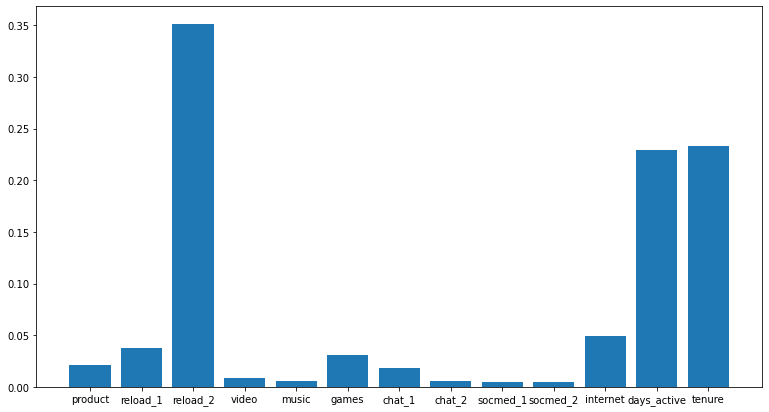

In [17]:
import matplotlib.pyplot as plt

importance = clf.feature_importances_
for i,v in enumerate(importance):
	print('Feature:', feature_cols[i],'Score: ', v, '%')
# plot feature importance
plt.figure(figsize=(13,7))
plt.bar([x for x in feature_cols], importance)
plt.show()

fitur reload_2 yang paling penting

In [43]:
# atribut predictor
x = df[['product', 'reload_1', 'reload_2', 'video', 'music', 'games', 'chat_1',
       'chat_2', 'socmed_1', 'socmed_2', 'internet', 'days_active', 'tenure']]
# atribut target
y = df['churn'].values

In [44]:
from sklearn import preprocessing
x = preprocessing.StandardScaler().fit(x).transform(x.astype(int))

In [45]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42) # 80% training and 20% test

In [46]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics

In [47]:
k = 4
#Train Model and Predict  
knn = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
knn

KNeighborsClassifier(n_neighbors=4)

In [48]:
yhat = knn.predict(X_test)

In [49]:
from sklearn import metrics
print("Train set Accuracy: ", metrics.accuracy_score(y_train, knn.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(y_test, yhat))

Train set Accuracy:  0.941
Test set Accuracy:  0.9195


Akurasi Decision Tree = 0.936 <br>
Akurasi KNN = 0.941 <br>
Maka KNN lebih baik berdasarkan nilai akurasinya